
**Image Description with Voice Assistance using RLSTM and CNN**


In [1]:
# Load the Drive helper and mount
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/caption/

/content/drive/MyDrive/caption


## Import Modules

In [3]:
import os
import pickle
import numpy as np
from tqdm.notebook import tqdm

from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, add

In [ ]:
!gdown --id '1HtqzMn_h9-5cVpLRFD8mwLGFm2rhdxJN'

/usr/local/lib/python3.9/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1HtqzMn_h9-5cVpLRFD8mwLGFm2rhdxJN
To: /content/ImageDataset.zip
100% 1.11G/1.11G [00:15<00:00, 71.3MB/s]


In [ ]:
!unzip "/content/ImageDataset.zip"


Streaming output truncated to the last 5000 lines.
  inflating: Images/2844846111_8c1cbfc75d.jpg  
  inflating: Images/2844963839_ff09cdb81f.jpg  
  inflating: Images/2845246160_d0d1bbd6f0.jpg  
  inflating: Images/2845691057_d4ab89d889.jpg  
  inflating: Images/2845845721_d0bc113ff7.jpg  
  inflating: Images/2846037553_1a1de50709.jpg  
  inflating: Images/2846785268_904c5fcf9f.jpg  
  inflating: Images/2846843520_b0e6211478.jpg  
  inflating: Images/2847514745_9a35493023.jpg  
  inflating: Images/2847615962_c330bded6e.jpg  
  inflating: Images/2847859796_4d9cb0d31f.jpg  
  inflating: Images/2848266893_9693c66275.jpg  
  inflating: Images/2848571082_26454cb981.jpg  
  inflating: Images/2848895544_6d06210e9d.jpg  
  inflating: Images/2848977044_446a31d86e.jpg  
  inflating: Images/2849194983_2968c72832.jpg  
  inflating: Images/2850719435_221f15e951.jpg  
  inflating: Images/2851198725_37b6027625.jpg  
  inflating: Images/2851304910_b5721199bc.jpg  
  inflating: Images/2851931813_eaf8ed

In [10]:
BASE_DIR = '/content/drive/MyDrive/caption'
WORKING_DIR = '/content/drive/MyDrive/caption/images'

## Extract Image Features

In [6]:
#model creation
model = VGG16()
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

print(model.summary())

553467096/553467096 [==============================] - 3s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

In [8]:
  #directory access to analyze images
features = {}
directory = os.path.join("/content/drive/MyDrive/caption", 'images')

for img_name in tqdm(os.listdir(directory)):
    
    img_path = directory + '/' + img_name
    image = load_img(img_path, target_size=(224, 224))
   
    image = img_to_array(image)
  
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
  
    image = preprocess_input(image)
    
    feature = model.predict(image, verbose=0)
 
    image_id = img_name.split('.')[0]
    
    features[image_id] = feature

  0%|          | 0/8092 [00:00<?, ?it/s]

In [11]:

pickle.dump(features, open(os.path.join(WORKING_DIR, 'features.pkl'), 'wb'))

In [12]:

with open(os.path.join(WORKING_DIR, 'features.pkl'), 'rb') as f:
    features = pickle.load(f)

## Load the Captions Data

In [13]:
with open(os.path.join(BASE_DIR, 'captions.txt'), 'r') as f:
    next(f)
    captions_doc = f.read()

In [14]:

mapping = {}
for line in tqdm(captions_doc.split('\n')):
  
    tokens = line.split(',')
    if len(line) < 2:
        continue
    image_id, caption = tokens[0], tokens[1:]
    image_id = image_id.split('.')[0]
    caption = " ".join(caption)
    if image_id not in mapping:
        mapping[image_id] = []
    mapping[image_id].append(caption)

  0%|          | 0/40456 [00:00<?, ?it/s]

In [15]:
len(mapping)

8091

## Preprocess Text Data

In [16]:
def clean(mapping):
    for key, captions in mapping.items():
        for i in range(len(captions)):
            caption = captions[i]
            caption = caption.lower()
            caption = caption.replace('[^A-Za-z]', '')
            caption = caption.replace('\s+', ' ')
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word)>1]) + ' endseq'
            captions[i] = caption

In [17]:

mapping['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [18]:

clean(mapping)

In [19]:

mapping['1000268201_693b08cb0e']

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq']

In [20]:
all_captions = []
for key in mapping:
    for caption in mapping[key]:
        all_captions.append(caption)

In [21]:
len(all_captions)

40455

In [22]:
all_captions[:10]

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq',
 'startseq black dog and spotted dog are fighting endseq',
 'startseq black dog and tri-colored dog playing with each other on the road endseq',
 'startseq black dog and white dog with brown spots are staring at each other in the street endseq',
 'startseq two dogs of different breeds looking at each other on the road endseq',
 'startseq two dogs on pavement moving toward each other endseq']

In [23]:

tokenizer = Tokenizer()
tokenizer.fit_on_texts(all_captions)
vocab_size = len(tokenizer.word_index) + 1

In [24]:
vocab_size

8485

In [25]:

max_length = max(len(caption.split()) for caption in all_captions)
max_length

35

## Train Test Split

In [26]:
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.90)
train = image_ids[:split]
test = image_ids[split:]

In [27]:

def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):
    X1, X2, y = list(), list(), list()
    n = 0
    while 1:
        for key in data_keys:
            n += 1
            captions = mapping[key]
            for caption in captions:
                seq = tokenizer.texts_to_sequences([caption])[0]
                for i in range(1, len(seq)):
                    in_seq, out_seq = seq[:i], seq[i]
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    X1.append(features[key][0])
                    X2.append(in_seq)
                    y.append(out_seq)
            if n == batch_size:
                X1, X2, y = np.array(X1), np.array(X2), np.array(y)
                yield [X1, X2], y
                X1, X2, y = list(), list(), list()
                n = 0

## Model Creation

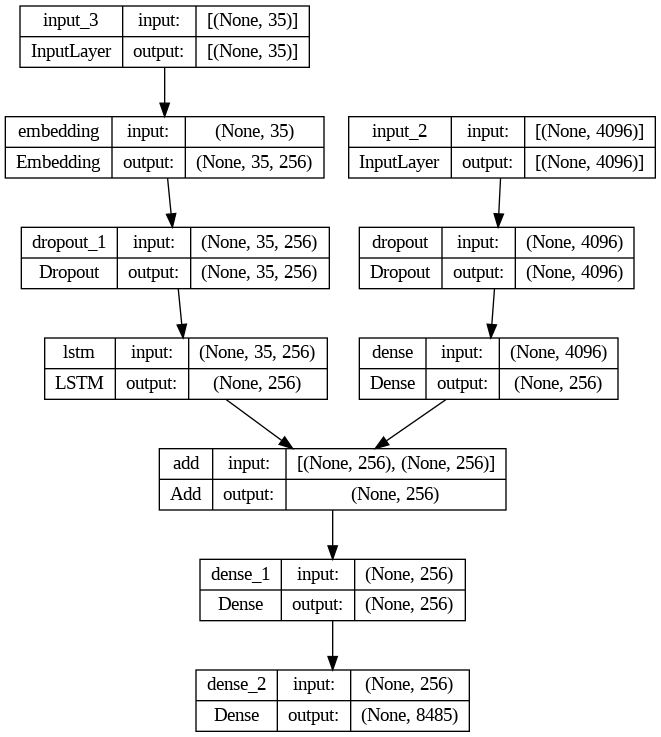

In [28]:

inputs1 = Input(shape=(4096,))
fe1 = Dropout(0.4)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2)
se2 = Dropout(0.4)(se1)
se3 = LSTM(256)(se2)
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

model = Model(inputs=[inputs1, inputs2], outputs=outputs)
model.compile(loss='categorical_crossentropy', optimizer='adam')
plot_model(model, show_shapes=True)

In [29]:

epochs = 20
batch_size = 32
steps = len(train) // batch_size

for i in range(epochs):
    generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
    model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)

227/227 [==============================] - 27s 120ms/step - loss: 2.1763


In [ ]:
%cd model

[Errno 2] No such file or directory: 'model'
/content


In [30]:

model.save(WORKING_DIR+'/best_model.h5')

## Generate Captions for the Image

In [31]:
def idx_to_word(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

In [32]:

def predict_caption(model, image, tokenizer, max_length):
    in_text = 'startseq'
    for i in range(max_length):
        
        sequence = tokenizer.texts_to_sequences([in_text])[0]
       
        sequence = pad_sequences([sequence], max_length)
        
        yhat = model.predict([image, sequence], verbose=0)
        
        yhat = np.argmax(yhat)
       
        word = idx_to_word(yhat, tokenizer)
        
        if word is None:
            break
       
        in_text += " " + word
        
        if word == 'endseq':
            break
      
    return in_text

In [33]:
from nltk.translate.bleu_score import corpus_bleu

actual, predicted = list(), list()

for key in tqdm(test):
    
    captions = mapping[key]
    
    y_pred = predict_caption(model, features[key], tokenizer, max_length) 
    
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    
    actual.append(actual_captions)
    predicted.append(y_pred)
    

print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))

  0%|          | 0/810 [00:00<?, ?it/s]

BLEU-1: 0.537369
BLEU-2: 0.312595


## Visualize the Results

In [36]:
from PIL import Image
import matplotlib.pyplot as plt
def generate_caption(image_name):
  
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR, "images", image_name)
    image = Image.open(img_path)
    captions = mapping[image_id]
    print('Actual Caption for Reference!')
    for caption in captions:
        print(caption)
   
    y_pred = predict_caption(model, features[image_id], tokenizer, max_length)
    print('Predicted Result')
    print(y_pred)
    plt.imshow(image)
    return y_pred

Actual Caption for Reference!
startseq black dog and spotted dog are fighting endseq
startseq black dog and tri-colored dog playing with each other on the road endseq
startseq black dog and white dog with brown spots are staring at each other in the street endseq
startseq two dogs of different breeds looking at each other on the road endseq
startseq two dogs on pavement moving toward each other endseq
Predicted Result
startseq two dogs play with each other on the grass endseq


'startseq two dogs play with each other on the grass endseq'

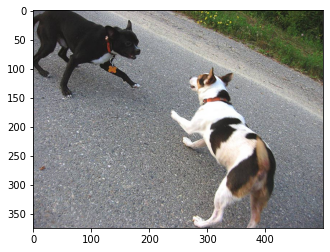

In [37]:
generate_caption("1001773457_577c3a7d70.jpg")

Actual Caption for Reference!
startseq man in hat is displaying pictures next to skier in blue hat endseq
startseq man skis past another man displaying paintings in the snow endseq
startseq person wearing skis looking at framed pictures set up in the snow endseq
startseq skier looks at framed pictures in the snow next to trees endseq
startseq man on skis looking at artwork for sale in the snow endseq
Predicted Result
startseq woman in red jacket skiing down snow covered hill endseq


'startseq woman in red jacket skiing down snow covered hill endseq'

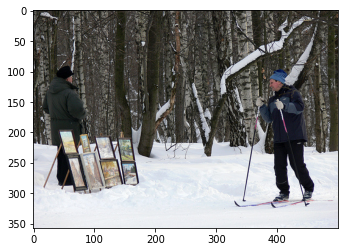

In [38]:

generate_caption("101669240_b2d3e7f17b.jpg")

Actual Caption for Reference!
startseq child in pink dress is climbing up set of stairs in an entry way endseq
startseq girl going into wooden building endseq
startseq little girl climbing into wooden playhouse endseq
startseq little girl climbing the stairs to her playhouse endseq
startseq little girl in pink dress going into wooden cabin endseq
Predicted Result
startseq woman in green dress is sitting on wooden bench endseq


'startseq woman in green dress is sitting on wooden bench endseq'

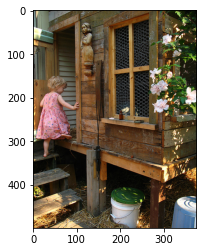

In [39]:
generate_caption("1000268201_693b08cb0e.jpg")

In [40]:
!pip install gTTS

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Actual Caption for Reference!
startseq child in pink dress is climbing up set of stairs in an entry way endseq
startseq girl going into wooden building endseq
startseq little girl climbing into wooden playhouse endseq
startseq little girl climbing the stairs to her playhouse endseq
startseq little girl in pink dress going into wooden cabin endseq
Predicted Result
startseq woman in green dress is sitting on wooden bench endseq
 woman in green dress is sitting on wooden bench


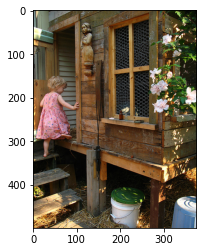

In [41]:
from gtts import gTTS
import os

t=generate_caption("1000268201_693b08cb0e.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")




In [42]:

os.system("mpg321 welcome.mp3")

32512

In [43]:
!pip install pydub

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [44]:

from pydub import AudioSegment

song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")

<_io.BufferedRandom name='final.wav'>

In [45]:
from IPython.display import Audio


sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq child in pink dress is climbing up set of stairs in an entry way endseq
startseq girl going into wooden building endseq
startseq little girl climbing into wooden playhouse endseq
startseq little girl climbing the stairs to her playhouse endseq
startseq little girl in pink dress going into wooden cabin endseq
Predicted Result
startseq woman in green dress is sitting on wooden bench endseq


'startseq woman in green dress is sitting on wooden bench endseq'

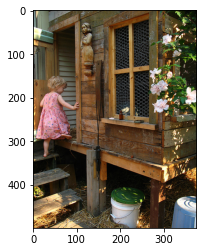

In [46]:
generate_caption("1000268201_693b08cb0e.jpg")

Actual Caption for Reference!
startseq man in cap and shorts sits on metal bench reading newspaper endseq
startseq "a man in t-shirt shorts and cap sitting on park bench reading paper ." endseq
startseq man reads the paper on wood an iron park bench endseq
startseq "a man sits on bench near sidewalk reading newspaper ." endseq
startseq man sits on bench reading newspaper endseq
Predicted Result
startseq man sits reading reading newspaper endseq
 man sits reading reading newspaper


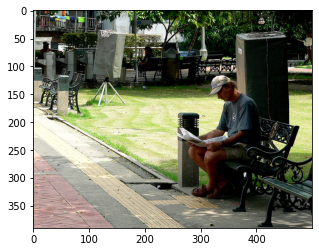

In [47]:
t=generate_caption("285306009_f6ddabe687.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'


myobj = gTTS(text=mytext, lang=language, slow=False)


myobj.save("welcome.mp3")




In [48]:
os.system("mpg321 welcome.mp3")

32512

In [49]:
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")

<_io.BufferedRandom name='final.wav'>

In [50]:
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq blonde child swims endseq
startseq boy is swimming in open water endseq
startseq child submerges from the water endseq
startseq kid comes up from the water endseq
startseq the small child comes up from underwater endseq
Predicted Result
startseq girl in pink life jacket and pink eyes is wearing pink life jacket endseq


'startseq girl in pink life jacket and pink eyes is wearing pink life jacket endseq'

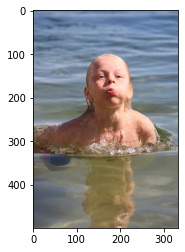

In [51]:
generate_caption("978580450_e862715aba.jpg")

Actual Caption for Reference!
startseq blonde child swims endseq
startseq boy is swimming in open water endseq
startseq child submerges from the water endseq
startseq kid comes up from the water endseq
startseq the small child comes up from underwater endseq
Predicted Result
startseq girl in pink life jacket and pink eyes is wearing pink life jacket endseq
 girl in pink life jacket and pink eyes is wearing pink life jacket


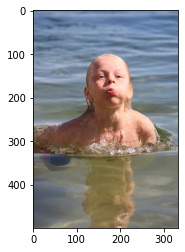

In [53]:
t=generate_caption("978580450_e862715aba.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq man in pink shirt climbs rock face endseq
startseq man is rock climbing high in the air endseq
startseq person in red shirt climbing up rock face covered in assist handles endseq
startseq rock climber in red shirt endseq
startseq rock climber practices on rock climbing wall endseq
Predicted Result
startseq man is climbing up red rock wall endseq


'startseq man is climbing up red rock wall endseq'

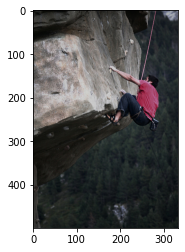

In [54]:
generate_caption("997722733_0cb5439472.jpg")

Actual Caption for Reference!
startseq man in pink shirt climbs rock face endseq
startseq man is rock climbing high in the air endseq
startseq person in red shirt climbing up rock face covered in assist handles endseq
startseq rock climber in red shirt endseq
startseq rock climber practices on rock climbing wall endseq
Predicted Result
startseq man is climbing up red rock wall endseq
 man is climbing up red rock wall


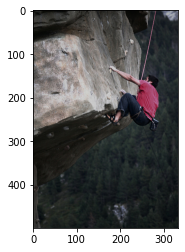

In [55]:
t=generate_caption("997722733_0cb5439472.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq one brown and white dog chasing black and white dog through the grass endseq
startseq the two dogs are running through the grass endseq
startseq two cocker spaniels running through the grass endseq
startseq two dogs are running through green yard endseq
startseq two dogs are running through the grass near house and trees endseq
Predicted Result
startseq dog is playing with dog in yard endseq


'startseq dog is playing with dog in yard endseq'

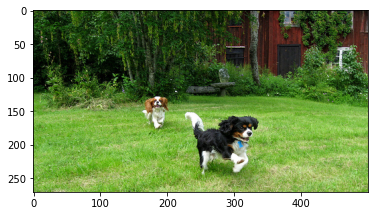

In [56]:
generate_caption("987907964_5a06a63609.jpg")

Actual Caption for Reference!
startseq one brown and white dog chasing black and white dog through the grass endseq
startseq the two dogs are running through the grass endseq
startseq two cocker spaniels running through the grass endseq
startseq two dogs are running through green yard endseq
startseq two dogs are running through the grass near house and trees endseq
Predicted Result
startseq dog is playing with dog in yard endseq
 dog is playing with dog in yard


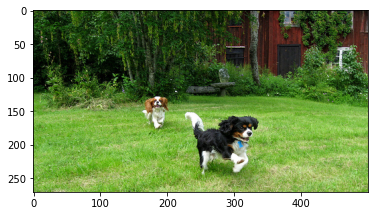

In [57]:
t=generate_caption("987907964_5a06a63609.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq man does wheelie on his bicycle on the sidewalk endseq
startseq man is doing wheelie on mountain bike endseq
startseq man on bicycle is on only the back wheel endseq
startseq asian man in orange hat is popping wheelie on his bike endseq
startseq man on bicycle riding on only one wheel endseq
Predicted Result
startseq man and woman are standing on bicycle outside endseq
 man and woman are standing on bicycle outside


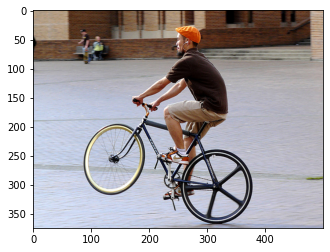

In [58]:
t=generate_caption("990890291_afc72be141.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq blonde child swims endseq
startseq boy is swimming in open water endseq
startseq child submerges from the water endseq
startseq kid comes up from the water endseq
startseq the small child comes up from underwater endseq
Predicted Result
startseq girl in pink life jacket and pink eyes is wearing pink life jacket endseq
 girl in pink life jacket and pink eyes is wearing pink life jacket


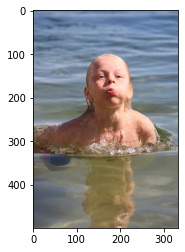

In [59]:

t=generate_caption("978580450_e862715aba.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq black and white dog is chasing ball on an open plane endseq
startseq black and white dog is running through grassy area endseq
startseq "a black and white dog runs on dry yellow field of grass ." endseq
startseq dog is running towards ball endseq
startseq dog runs through field chasing ball endseq
Predicted Result
startseq black and white dog is running through the grass endseq


'startseq black and white dog is running through the grass endseq'

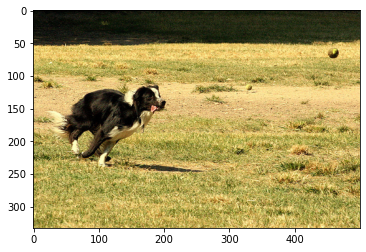

In [60]:
generate_caption("895502702_5170ada2ee.jpg")

Actual Caption for Reference!
startseq black and white dog is chasing ball on an open plane endseq
startseq black and white dog is running through grassy area endseq
startseq "a black and white dog runs on dry yellow field of grass ." endseq
startseq dog is running towards ball endseq
startseq dog runs through field chasing ball endseq
Predicted Result
startseq black and white dog is running through the grass endseq
 black and white dog is running through the grass


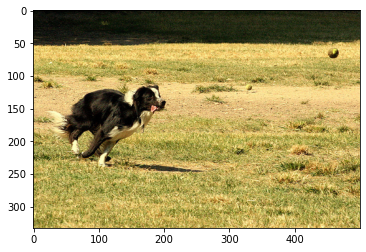

In [61]:
t=generate_caption("895502702_5170ada2ee.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq dog is running through lake towards some trees endseq
startseq dog running into pond to fetch something endseq
startseq dog swimming in pond endseq
startseq an animal is attempting to cross the river endseq
startseq an unknown animal or person is swimming in natural lake setting endseq
Predicted Result
startseq dog is walking through the water endseq


'startseq dog is walking through the water endseq'

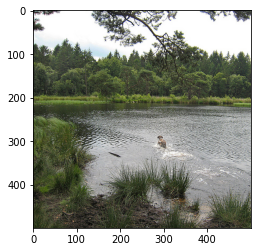

In [62]:
generate_caption("610590753_cd69ce081a.jpg")

Actual Caption for Reference!
startseq dog is running through lake towards some trees endseq
startseq dog running into pond to fetch something endseq
startseq dog swimming in pond endseq
startseq an animal is attempting to cross the river endseq
startseq an unknown animal or person is swimming in natural lake setting endseq
Predicted Result
startseq dog is walking through the water endseq
 dog is walking through the water


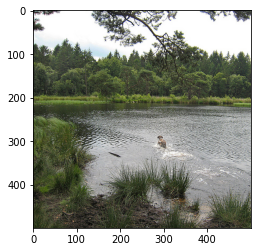

In [63]:
t=generate_caption("610590753_cd69ce081a.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq black and white dog jumping into the air endseq
startseq black and white dog jumping to catch ball endseq
startseq dog jumping high into the air in the country endseq
startseq dog jumping in the shade of trees endseq
startseq "a dog jumps high with its mouth open ." endseq
Predicted Result
startseq dog is jumping over brick wall endseq
 dog is jumping over brick wall


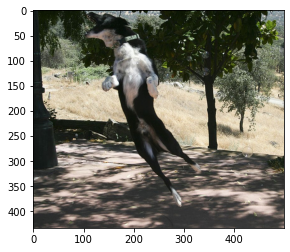

In [64]:
t=generate_caption("624058168_f1c5e87e59.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq kayaker almost turns over endseq
startseq kayaker traverses some churning rapids endseq
startseq man is kayaking in rough water endseq
startseq man kayaks in wavy water endseq
startseq person in blue kayak battles the waves endseq
Predicted Result
startseq man in green shorts is being pulled into the water endseq
 man in green shorts is being pulled into the water


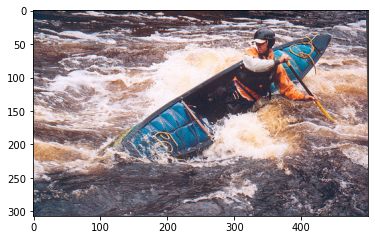

In [65]:
t=generate_caption("482088914_e6ea4501e9.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq large brown dog and small black dog stand near each other on dirt patch surrounding by grass and weeds endseq
startseq large brown dog and small grey dog on rocky surface with weeds behind them endseq
startseq large brown dog has his noce on the back of small black dog endseq
startseq small black dog is shocked when larger brown dog gives him sniff endseq
startseq the brown dog sniffs the back of smaller black dog endseq
Predicted Result
startseq two large dogs are playing in the grass endseq
 two large dogs are playing in the grass


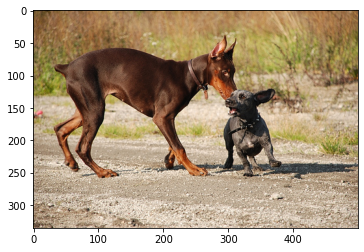

In [66]:
t=generate_caption("2874728371_ccd6db87f3.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq man in white suit walks down the street holding newspaper endseq
startseq man in white suit walks outside carrying newspaper endseq
startseq man wearing white suit holding newspaper walking through the streets endseq
startseq "the man holding newspaper is wearing white suit black shirt and black shoes ." endseq
startseq the man is wearing white suit and walking on the street endseq
Predicted Result
startseq man in kimono walks down the street endseq
 man in kimono walks down the street


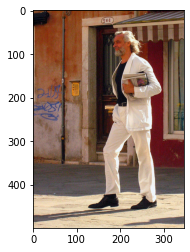

In [67]:
t=generate_caption("2848266893_9693c66275.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("//content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq brown and black dog is standing on its hind legs trying to catch something endseq
startseq dog is jumping up on hind legs with its mouth open endseq
startseq dog plays on the grass endseq
startseq german shepherd playing with water in the grass endseq
startseq german shepherd standing up snapping at droplets of water endseq
Predicted Result
startseq brown and white dog is playing with ball in the grass endseq
 brown and white dog is playing with ball in the grass


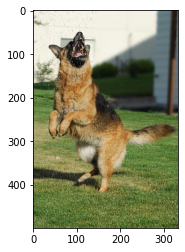

In [68]:
t=generate_caption("888517718_3d5b4b7b43.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq man climber large rock without any gear while his friends watch endseq
startseq person climbing rock while others are standing around and watching endseq
startseq person hangs off large rock as other people watch endseq
startseq rock climber hangs from ledge while others look on endseq
startseq man dangling from rock as spectators watch endseq
Predicted Result
startseq man in blue shirt is watching child in the air endseq
 man in blue shirt is watching child in the air


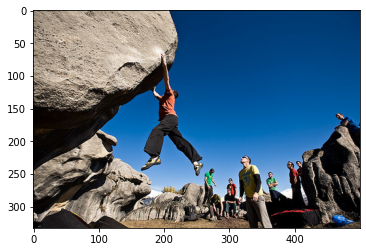

In [69]:
t=generate_caption("2844846111_8c1cbfc75d.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq snowboarder flies through the air endseq
startseq snowboarder in midair endseq
startseq "a snowboarder in midair hovering over snow ramp ." endseq
startseq snowboarder is leaping of jump in the mountains endseq
startseq snowboarder jumps off of ramp in the snowy mountains endseq
Predicted Result
startseq white airplane is flying over snow covered half pipe endseq
 white airplane is flying over snow covered half pipe


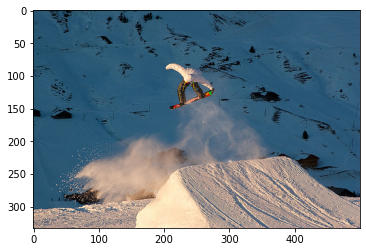

In [70]:
t=generate_caption("3154293126_e52bd07524.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq brown dogs and woman in yard endseq
startseq brown dog persues frisbee across the grass as the thrower watches endseq
startseq woman in blue jacket watches as her two brown dogs play with red ball in grassy yard endseq
startseq woman throws frisbee for her two brown dogs to chase endseq
startseq woman watches brown dog run away from house across the grass endseq
Predicted Result
startseq dog is standing in the yard with dog and dog endseq
 dog is standing in the yard with dog and dog


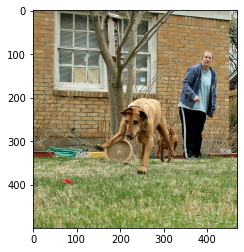

In [71]:
t=generate_caption("439916996_1ddb9dc8e7.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq "three fishers walk over rocks toward water lake and cloudy sky in background ." endseq
startseq three people are standing on rocks near body of water endseq
startseq three people are walking on rocks towards lake endseq
startseq three people stand with fishing poles on the rocks near the water endseq
startseq "three people walking along rocks going to go fish" endseq
Predicted Result
startseq man in swimsuit is standing on the edge of the ocean endseq
 man in swimsuit is standing on the edge of the ocean


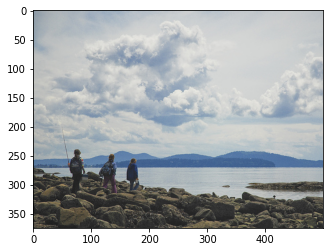

In [72]:
t=generate_caption("636503038_17ca82b50f.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq an adult and child hold hands as they walk up grassy hill endseq
startseq woman and child are holding hands walking up grassy hill on fair day endseq
startseq woman and child walking uphill endseq
startseq woman and young girl climbing grassy hill endseq
startseq woman with her sweatshirt tied around her waist holding hands with young girl in green shirt as they walk up grassy hill endseq
Predicted Result
startseq two boys walking on dirt road endseq
 two boys walking on dirt road


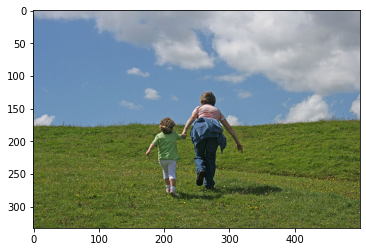

In [73]:
t=generate_caption("753285176_f21a2b984d.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq climber is sillhouetted against the sky and rocks as he hangs by rope from another rock endseq
startseq person hangs from safety rope as he climbs down large cliff endseq
startseq person is abseiling down rock face attached to rope endseq
startseq person jumping down rope on cliff endseq
startseq the man repels down the side of cliff endseq
Predicted Result
startseq man is climbing cliff endseq
 man is climbing cliff


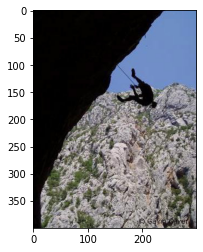

In [74]:
t=generate_caption("883040210_3c4a10f030.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq group is sitting around snowy crevasse endseq
startseq group of people sit atop snowy mountain endseq
startseq group of people sit in the snow overlooking mountain scene endseq
startseq five children getting ready to sled endseq
startseq five people are sitting together in the snow endseq
Predicted Result
startseq snowboarder races down snow covered hill endseq
 snowboarder races down snow covered hill


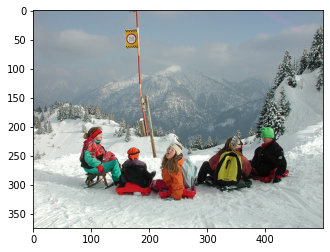

In [75]:
t=generate_caption("99171998_7cc800ceef.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq boy jump kicks off dock into lake endseq
startseq little boy jumping off of dock into lake endseq
startseq "a young boy is leaping off pier into the water his leg thrust out ." endseq
startseq young boy jumps off of wooden dock and into the water endseq
startseq the boy wearing swimming trunks is jumping off pier into lake endseq
Predicted Result
startseq woman in black shorts jumps into the water endseq
 woman in black shorts jumps into the water


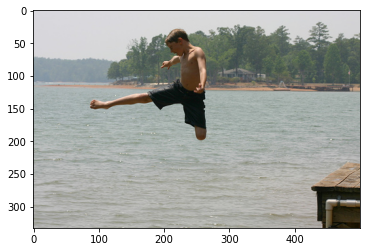

In [76]:
t=generate_caption("529101401_ab1f6b1206.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq dog stands shoulder deep in muddy water endseq
startseq dog with white fur is moving through deep murky water endseq
startseq light tan dog swimming through swampy water endseq
startseq white dog is standing in mud up to its neck endseq
startseq white dog is wading in natural water with algae endseq
Predicted Result
startseq dog treads the water endseq
 dog treads the water


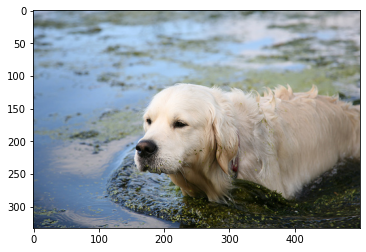

In [77]:
t=generate_caption("769260947_02bc973d76.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)

Actual Caption for Reference!
startseq skinny girl rides by on bike with lot of people in the background endseq
startseq thin young woman in green t-shirt cycles by grey car endseq
startseq woman riding bicycle past car and group of people on sidewalk endseq
startseq young woman riding bike down street past crowd of people endseq
startseq people of all ilks on busy street endseq
Predicted Result
startseq woman in black shorts and sunglasses walks down sidewalk endseq
 woman in black shorts and sunglasses walks down sidewalk


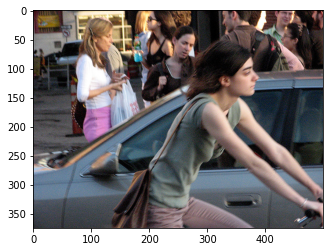

In [78]:
t=generate_caption("519754987_51861fea85.jpg")

mytext = t[8:-7]
print(mytext)


language = 'en'
myobj = gTTS(text=mytext, lang=language, slow=False)

myobj.save("welcome.mp3")
os.system("mpg321 welcome.mp3")
song = AudioSegment.from_mp3("/content/drive/MyDrive/caption/welcome.mp3")
song.export("final.wav", format="wav")
sound = 'final.wav'
Audio(sound)